In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [2]:
run_id = ''
train_epochs = 21
start_epoch = 0
dataset_size = 100000
lr = 1e-4
decay_rate = 0
decay_steps = 1
style_loss_weight = 10
tv_weight = 0
additional_tags = {'Upsampling' : 'Nearest', 'Style_loss' : 'Gram_matrix'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=4444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=125, test_steps=125)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 559ms/step - loss: 2406200.7500 - val_loss: 1546064.3750
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 572s 572ms/step - loss: 1349438.7500 - val_loss: 1210393.8750
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 576ms/step - loss: 1280420.3750 - val_loss: 1021041.6875
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 577s 577ms/step - loss: 1006756.8750 - val_loss: 1708786.0000
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 1130962.5000 - val_loss: 955225.0625
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 1248152.7500 - val_loss: 988910.0625
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 1067996.8750 - val_loss: 963297.8750
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 988919.1875 - val_loss: 1240716.8750
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 1298452.2500 - val_loss: 851346.1250
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 582ms/step - loss: 93

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 877197.2500 - val_loss: 884283.0000
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 937683.3750 - val_loss: 854146.0000
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 1101729.7500 - val_loss: 829478.1875
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 582s 583ms/step - loss: 888130.3125 - val_loss: 973844.4375
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 806758.1875 - val_loss: 922841.2500
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 703813.9375 - val_loss: 841249.0625
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 746350.0000 - val_loss: 1210647.3750
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 981951.5000 - val_loss: 707202.0625
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 768569.0000 - val_loss: 715362.8750
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 7745

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 574s 574ms/step - loss: 950629.2500 - val_loss: 982711.8750
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 578s 578ms/step - loss: 773382.3750 - val_loss: 739361.8750
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 580s 580ms/step - loss: 878227.2500 - val_loss: 727480.3125
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 738474.2500 - val_loss: 651113.8750
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 590s 590ms/step - loss: 689561.1875 - val_loss: 709239.3125
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 593s 593ms/step - loss: 642113.4375 - val_loss: 674864.9375
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 594s 594ms/step - loss: 710655.9375 - val_loss: 722449.6875
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 596s 596ms/step - loss: 826700.4375 - val_loss: 786829.6875
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 596s 596ms/step - loss: 717536.6250 - val_loss: 819959.2500
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 594s 594ms/step - loss: 798678

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 715024.0000 - val_loss: 685014.0000
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 586s 587ms/step - loss: 687534.1250 - val_loss: 615242.5000
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 585s 585ms/step - loss: 803384.3125 - val_loss: 763394.2500
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 693136.6250 - val_loss: 628735.8125
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 587s 587ms/step - loss: 718105.4375 - val_loss: 918913.0000
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 591s 591ms/step - loss: 842384.4375 - val_loss: 650158.8125
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 597s 597ms/step - loss: 683213.6875 - val_loss: 742495.9375
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 598s 598ms/step - loss: 655860.7500 - val_loss: 737128.7500
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 598s 598ms/step - loss: 686754.0000 - val_loss: 683660.7500
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 598s 598ms/step - loss: 697545

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 583s 583ms/step - loss: 658529.3125 - val_loss: 670422.0625
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 588s 588ms/step - loss: 701890.1250 - val_loss: 879320.6250
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 597s 597ms/step - loss: 702393.3750 - val_loss: 716136.1875
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 576s 577ms/step - loss: 918546.6875 - val_loss: 1351001.3750
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 793733.4375 - val_loss: 661875.8125
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 838518.0000 - val_loss: 657017.2500
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 753378.8125 - val_loss: 673331.1250
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 654640.6875 - val_loss: 661072.1875
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 760575.5625 - val_loss: 575976.2500
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 66194

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 776705.0625 - val_loss: 706512.4375
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 552s 552ms/step - loss: 629120.8125 - val_loss: 635753.3750
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 595794.3750 - val_loss: 638757.0625
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 671543.1875 - val_loss: 644801.9375
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 723208.6875 - val_loss: 671152.8125
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 712722.9375 - val_loss: 549846.5000
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 768894.5000 - val_loss: 615783.5625
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 807998.4375 - val_loss: 620904.6250
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 603396.0625 - val_loss: 765590.3750
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 577110

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 971947.1875 - val_loss: 626670.8750
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 610205.1875 - val_loss: 668753.0625
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 713597.0625 - val_loss: 594328.8125
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 613724.6250 - val_loss: 934890.8750
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 578636.5000 - val_loss: 565891.9375
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 820992.0000 - val_loss: 584450.5000
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 646916.8125 - val_loss: 589056.3750
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 569062.5625 - val_loss: 725950.6250
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 735544.3125 - val_loss: 609676.9375
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 651667

Epoch 71/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 565761.7500 - val_loss: 1115290.3750
Epoch 72/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 797520.9375 - val_loss: 680666.6250
Epoch 73/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 966481.0000 - val_loss: 755037.2500
Epoch 74/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 721155.1250 - val_loss: 528492.4375
Epoch 75/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 568353.6250 - val_loss: 734921.9375
Epoch 76/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 578436.5000 - val_loss: 696140.3125
Epoch 77/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 689977.6250 - val_loss: 760031.5000
Epoch 78/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 837856.5000 - val_loss: 610398.0625
Epoch 79/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 678297.0000 - val_loss: 567239.7500
Epoch 80/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 59238

Epoch 81/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 585825.1875 - val_loss: 891352.4375
Epoch 82/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 621641.5625 - val_loss: 1480599.0000
Epoch 83/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 647750.1250 - val_loss: 521842.8438
Epoch 84/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 595022.5625 - val_loss: 576442.2500
Epoch 85/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 603984.0000 - val_loss: 554763.6875
Epoch 86/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 604266.2500 - val_loss: 552217.3750
Epoch 87/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 726389.3750 - val_loss: 748203.5000
Epoch 88/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 668978.7500 - val_loss: 587935.1875
Epoch 89/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 567134.5625 - val_loss: 588404.6875
Epoch 90/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 59162

Epoch 91/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 615975.8750 - val_loss: 737568.8125
Epoch 92/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 596134.1250 - val_loss: 695683.8750
Epoch 93/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms/step - loss: 593123.8750 - val_loss: 552621.9375
Epoch 94/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 591997.7500 - val_loss: 579272.3125
Epoch 95/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 590354.3750 - val_loss: 498535.2500
Epoch 96/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 552314.5000 - val_loss: 529371.0625
Epoch 97/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 633102.1875 - val_loss: 776279.1875
Epoch 98/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 769957.1875 - val_loss: 731170.8125
Epoch 99/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 641584.4375 - val_loss: 619651.0625
Epoch 100/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - l

Epoch 101/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 586835.0000 - val_loss: 618591.1250
Epoch 102/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 675343.8125 - val_loss: 643758.7500
Epoch 103/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 567340.5625 - val_loss: 604389.1250
Epoch 104/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 563423.3750 - val_loss: 608995.4375
Epoch 105/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 604871.3750 - val_loss: 568151.5000
Epoch 106/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 580517.7500 - val_loss: 575129.0000
Epoch 107/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 536367.5000 - val_loss: 568377.0625
Epoch 108/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 985158.3125 - val_loss: 629525.6250
Epoch 109/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 689516.0625 - val_loss: 1226794.3750
Epoch 110/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558m

Epoch 111/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 567898.0000 - val_loss: 553856.0000
Epoch 112/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 559398.7500 - val_loss: 681073.1250
Epoch 113/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 642044.7500 - val_loss: 542935.2500
Epoch 114/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 721756.9375 - val_loss: 625106.3125
Epoch 115/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 627346.9375 - val_loss: 595455.3125
Epoch 116/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 577816.0000 - val_loss: 570506.1875
Epoch 117/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 664485.6875 - val_loss: 806540.4375
Epoch 118/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 736002.6250 - val_loss: 622251.3125
Epoch 119/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 639139.0000 - val_loss: 667829.5625
Epoch 120/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms

Epoch 121/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 706050.0625 - val_loss: 519879.0625
Epoch 122/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 581500.4375 - val_loss: 709236.8750
Epoch 123/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 675062.5625 - val_loss: 606320.1875
Epoch 124/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 549513.5000 - val_loss: 614175.2500
Epoch 125/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 726266.0625 - val_loss: 632754.0625
Epoch 126/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 558781.0000 - val_loss: 490187.7812
Epoch 127/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 555s 555ms/step - loss: 551018.8125 - val_loss: 606098.0625
Epoch 128/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 586246.6875 - val_loss: 600511.3750
Epoch 129/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 649911.3750 - val_loss: 590776.5000
Epoch 130/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms

Epoch 131/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 567622.4375 - val_loss: 566062.7500
Epoch 132/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 566566.5625 - val_loss: 494004.3125
Epoch 133/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 527586.1875 - val_loss: 500542.8750
Epoch 134/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 675372.3125 - val_loss: 562944.1250
Epoch 135/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 568115.9375 - val_loss: 533144.9375
Epoch 136/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 982400.1250 - val_loss: 570707.0000
Epoch 137/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 519693.7812 - val_loss: 528650.8750
Epoch 138/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 515874.4062 - val_loss: 597812.1875
Epoch 139/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 553s 553ms/step - loss: 829259.2500 - val_loss: 602185.3750
Epoch 140/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 554s 554ms

Epoch 141/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 895398.3125 - val_loss: 553716.3750
Epoch 142/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 529674.3125 - val_loss: 471884.7500
Epoch 143/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 498127.5312 - val_loss: 531748.0625
Epoch 144/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 528107.3125 - val_loss: 626594.1250
Epoch 145/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 578201.5625 - val_loss: 517641.6250
Epoch 146/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 639583.9375 - val_loss: 600423.0000
Epoch 147/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 523336.7500 - val_loss: 531020.5000
Epoch 148/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms/step - loss: 521803.4688 - val_loss: 537323.6875
Epoch 149/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559ms/step - loss: 531835.3125 - val_loss: 588765.7500
Epoch 150/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 558s 558ms

Epoch 151/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 1013348.9375 - val_loss: 705389.5625
Epoch 152/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 741917.8750 - val_loss: 607361.0625
Epoch 153/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 603714.1250 - val_loss: 1255892.1250
Epoch 154/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 935369.5000 - val_loss: 742987.3750
Epoch 155/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 565s 565ms/step - loss: 590137.0625 - val_loss: 515812.1250
Epoch 156/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 542087.9375 - val_loss: 535522.4375
Epoch 157/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 570981.8125 - val_loss: 584393.3750
Epoch 158/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 563ms/step - loss: 555296.3750 - val_loss: 561811.2500
Epoch 159/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 564s 564ms/step - loss: 548835.0625 - val_loss: 553552.8750
Epoch 160/160
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563

Epoch 161/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 518933.5625 - val_loss: 586487.3750
Epoch 162/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 537603.7500 - val_loss: 499906.6562
Epoch 163/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 952328.0625 - val_loss: 612819.5000
Epoch 164/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 588801.8125 - val_loss: 622776.9375
Epoch 165/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 554891.6875 - val_loss: 541108.6875
Epoch 166/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 556s 556ms/step - loss: 612108.0625 - val_loss: 587890.1250
Epoch 167/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 669568.0625 - val_loss: 533061.2500
Epoch 168/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 581882.6875 - val_loss: 516428.0312
Epoch 169/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 1166637.1250 - val_loss: 585341.8125
Epoch 170/170
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 559s 559m

Epoch 171/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 612119.3750 - val_loss: 1476567.2500
Epoch 172/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 917310.0000 - val_loss: 685651.9375
Epoch 173/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 592288.7500 - val_loss: 661287.8750
Epoch 174/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 569983.0625 - val_loss: 495480.1562
Epoch 175/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 584487.5625 - val_loss: 476724.5938
Epoch 176/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 529624.0625 - val_loss: 561341.7500
Epoch 177/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 522372.3750 - val_loss: 566471.1875
Epoch 178/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 541238.8125 - val_loss: 666381.3125
Epoch 179/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 563s 563ms/step - loss: 595149.3750 - val_loss: 611787.0000
Epoch 180/180
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560m

Epoch 181/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 552883.1875 - val_loss: 673662.8750
Epoch 182/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 579590.6875 - val_loss: 538415.8750
Epoch 183/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 658470.5625 - val_loss: 617403.9375
Epoch 184/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 557s 557ms/step - loss: 545087.4375 - val_loss: 568025.6250
Epoch 185/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 553648.0000 - val_loss: 518152.0000
Epoch 186/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 540746.5625 - val_loss: 490767.1250
Epoch 187/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 569181.5625 - val_loss: 541736.3750
Epoch 188/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 557183.6875 - val_loss: 524955.5000
Epoch 189/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 504155.0938 - val_loss: 555533.0000
Epoch 190/190
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms

Epoch 191/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 580911.6875 - val_loss: 812292.1250
Epoch 192/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 602872.1875 - val_loss: 598621.4375
Epoch 193/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 560s 560ms/step - loss: 580500.5000 - val_loss: 540445.6250
Epoch 194/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 583645.0000 - val_loss: 551900.5625
Epoch 195/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 600847.0625 - val_loss: 725528.5625
Epoch 196/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 576723.7500 - val_loss: 623825.1875
Epoch 197/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 568393.9375 - val_loss: 548341.9375
Epoch 198/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 543052.2500 - val_loss: 622015.0625
Epoch 199/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 561s 561ms/step - loss: 554304.6250 - val_loss: 582725.0000
Epoch 200/200
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms

Epoch 201/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 703135.4375 - val_loss: 700558.0625
Epoch 202/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 517356.4062 - val_loss: 493475.9688
Epoch 203/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 562s 562ms/step - loss: 513280.6562 - val_loss: 517619.8438
Epoch 204/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 567ms/step - loss: 474054.2500 - val_loss: 598354.6250
Epoch 205/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568ms/step - loss: 523546.7812 - val_loss: 1324535.2500
Epoch 206/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 952200.3750 - val_loss: 548750.8750
Epoch 207/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 566s 566ms/step - loss: 510296.4062 - val_loss: 503228.1875
Epoch 208/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 567s 567ms/step - loss: 522324.4375 - val_loss: 992345.7500
Epoch 209/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 569s 569ms/step - loss: 844861.5625 - val_loss: 759612.4375
Epoch 210/210
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 568s 568m

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

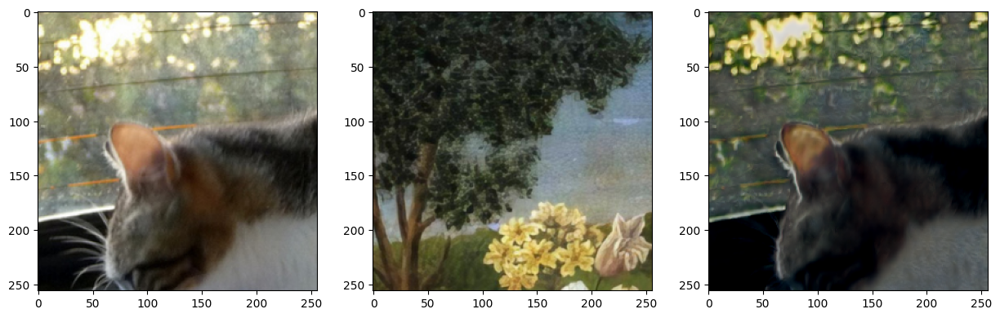

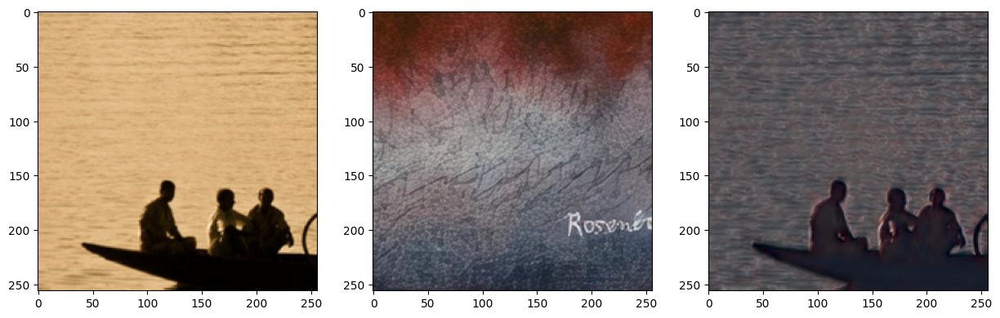

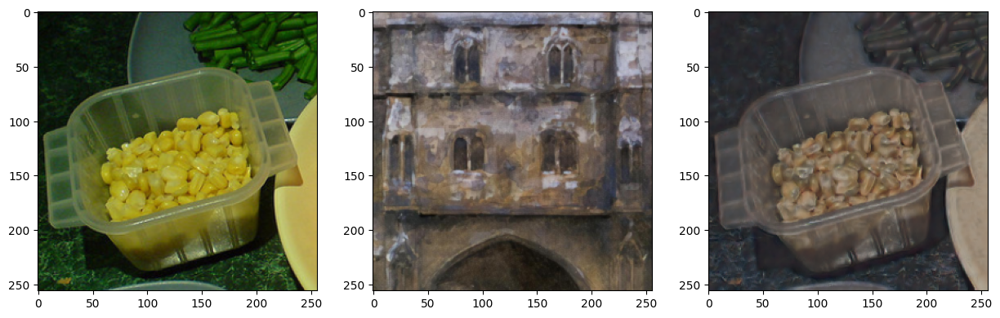

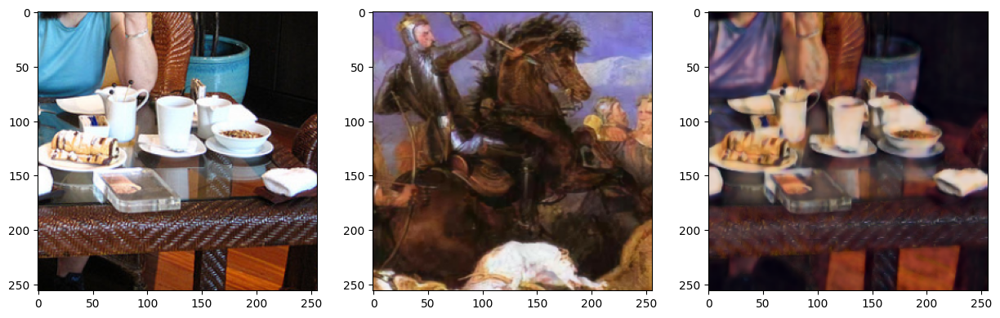

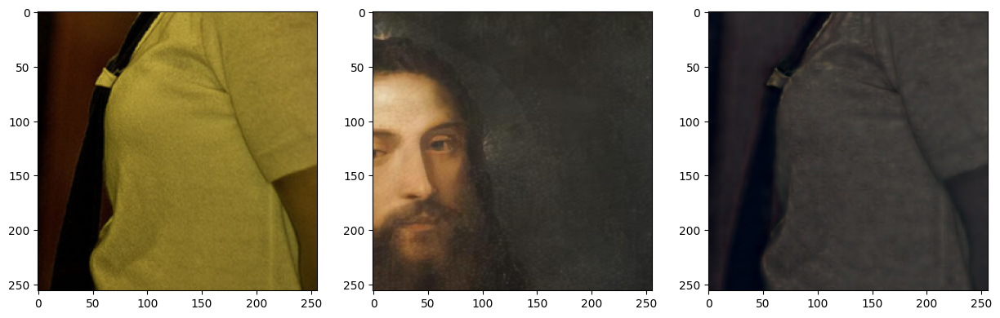

...

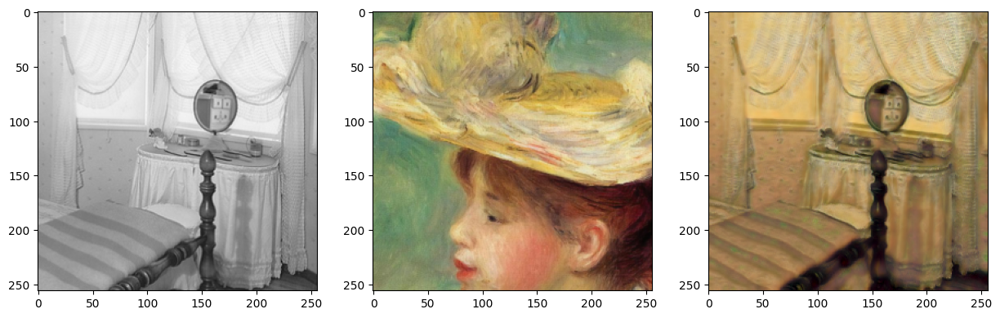

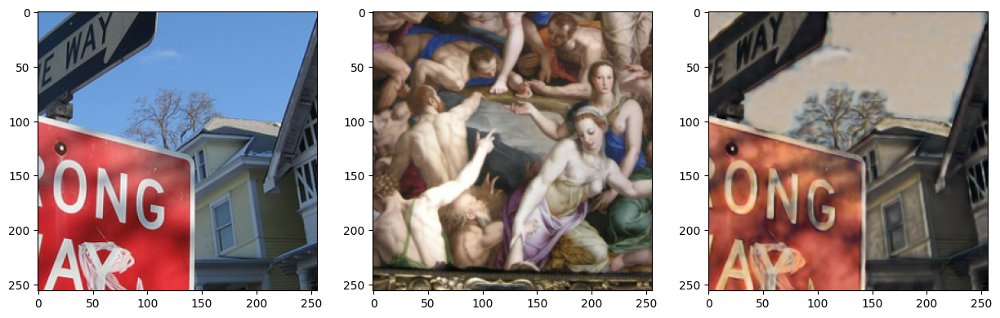

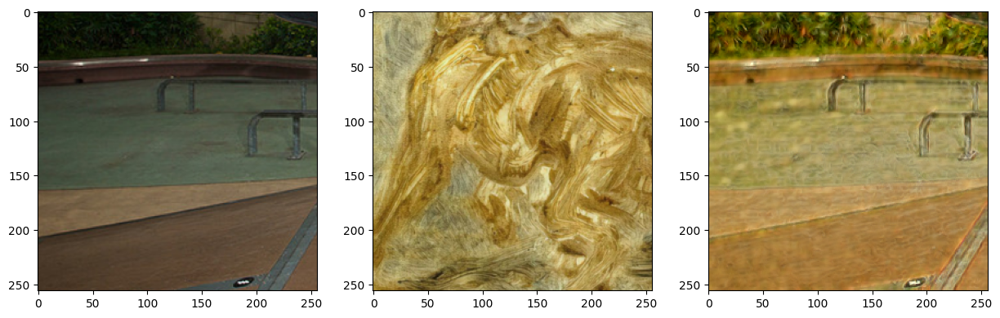

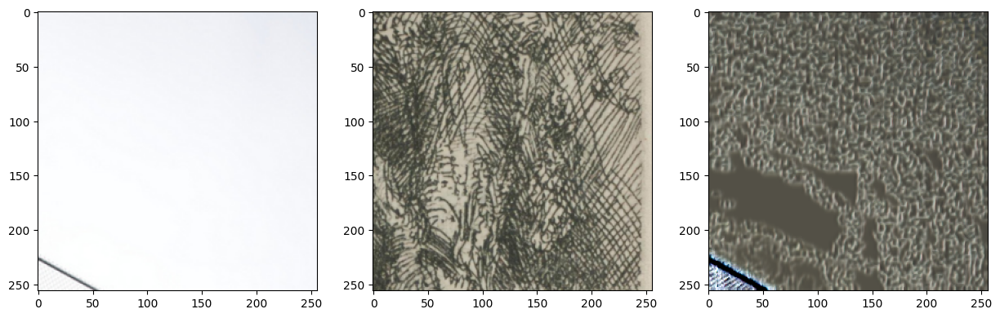

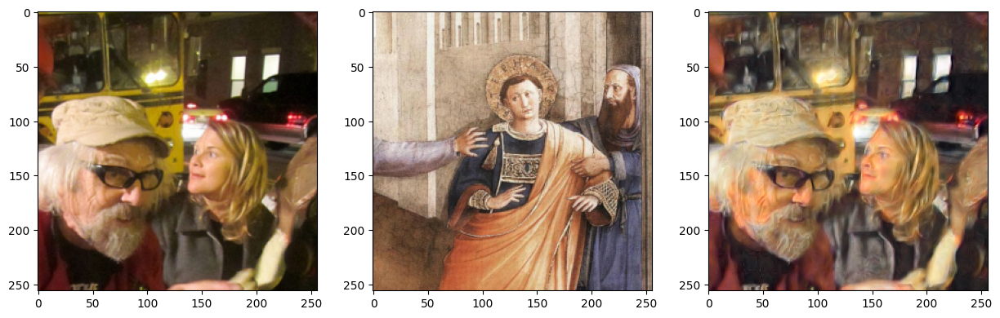

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [7]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')
city = Path('D:/StyleTransferAI/StyleTransferAI/test_images/city.jpg')
oil_paint = Path('D:/StyleTransferAI/StyleTransferAI/test_images/oil_paint.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

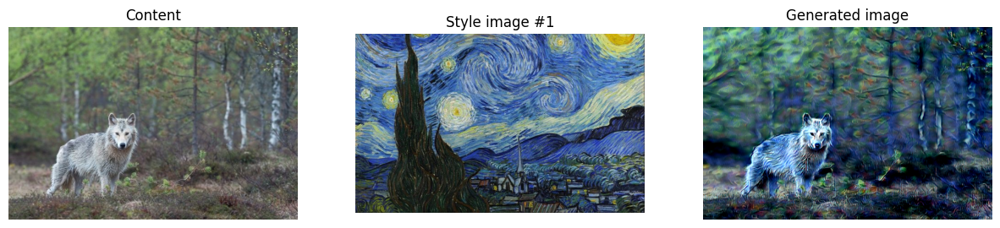

In [14]:
model.generate(wolf, van_gogh, show_img=True, show_inputs=True, resize_size=1500)

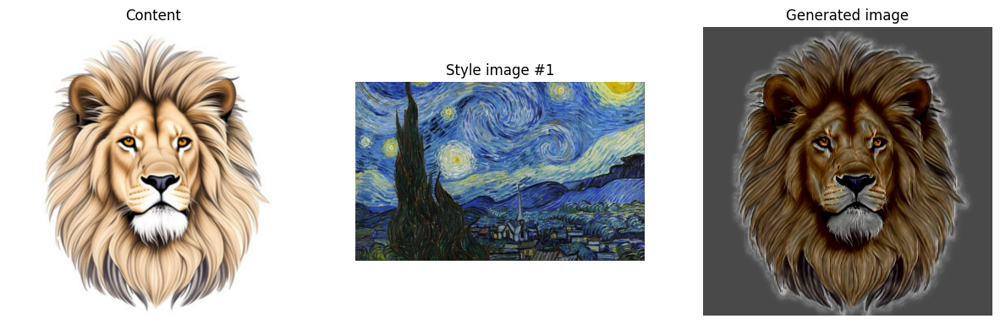

In [9]:
model.generate(scaled_lion, van_gogh, preserve_colors=True, show_img=True, show_inputs=True)

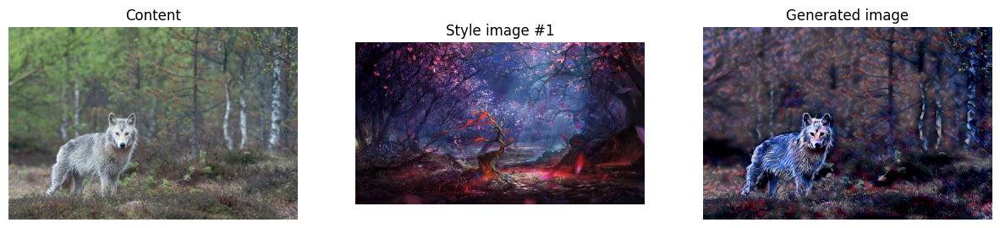

In [10]:
model.generate(wolf, wp, show_img=True, show_inputs=True)

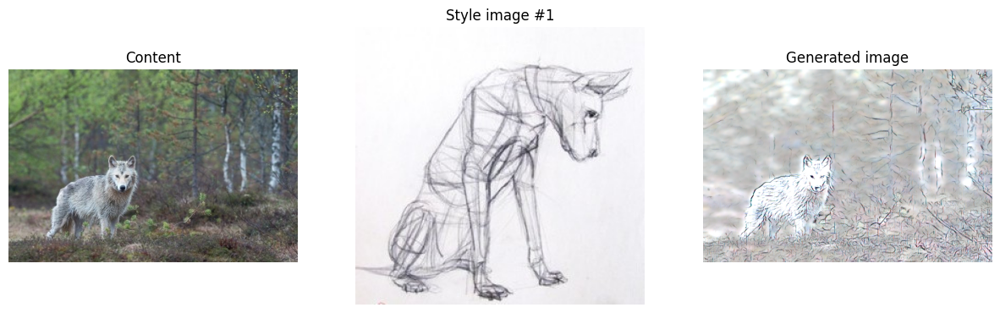

In [11]:
model.generate(wolf, drawing, show_img=True, show_inputs=True, style_scales=0.2)

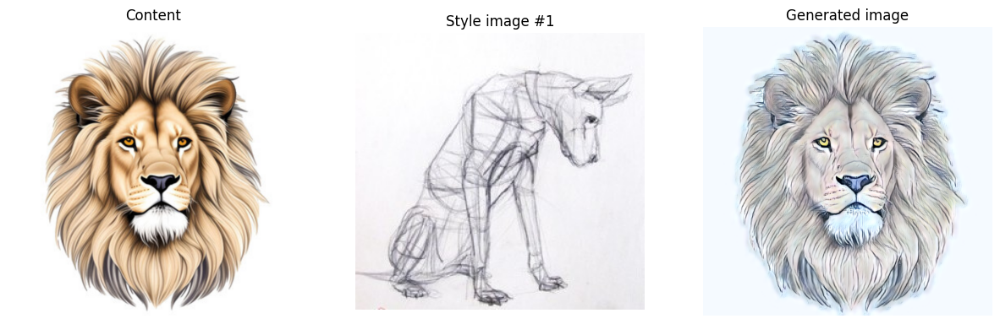

In [12]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True, style_scales = 0.2)

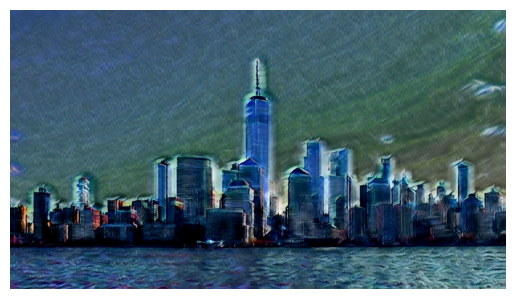

In [13]:
model.generate(city, van_gogh, show_img=True)

In [19]:
model.generate(city, oil_paint, show_img=True, show_inputs=True, resize_size=2000)

OutOfMemoryError: Exception encountered when calling ReflectiveConv2D.call().

[1mCUDA out of memory. Tried to allocate 978.00 MiB. GPU 0 has a total capacity of 8.00 GiB of which 0 bytes is free. Of the allocated memory 12.77 GiB is allocated by PyTorch, and 808.22 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)[0m

Arguments received by ReflectiveConv2D.call():
  • inputs=torch.Tensor(shape=torch.Size([1, 2000, 2000, 3]), dtype=float32)